In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set_style('whitegrid')

import os
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, mean_squared_error, accuracy_score, roc_auc_score, jaccard_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

In [2]:
filepath = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-ML0101EN-SkillUp/labs/ML-FinalAssignment/Weather_Data.csv"

In [3]:
df = pd.read_csv(filepath)
df.head()

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2/1/2008,19.5,22.4,15.6,6.2,0.0,W,41,S,SSW,...,92,84,1017.6,1017.4,8,8,20.7,20.9,Yes,Yes
1,2/2/2008,19.5,25.6,6.0,3.4,2.7,W,41,W,E,...,83,73,1017.9,1016.4,7,7,22.4,24.8,Yes,Yes
2,2/3/2008,21.6,24.5,6.6,2.4,0.1,W,41,ESE,ESE,...,88,86,1016.7,1015.6,7,8,23.5,23.0,Yes,Yes
3,2/4/2008,20.2,22.8,18.8,2.2,0.0,W,41,NNE,E,...,83,90,1014.2,1011.8,8,8,21.4,20.9,Yes,Yes
4,2/5/2008,19.7,25.7,77.4,4.8,0.0,W,41,NNE,W,...,88,74,1008.3,1004.8,8,8,22.5,25.5,Yes,Yes


In [4]:
df.shape

(3271, 22)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3271 entries, 0 to 3270
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           3271 non-null   object 
 1   MinTemp        3271 non-null   float64
 2   MaxTemp        3271 non-null   float64
 3   Rainfall       3271 non-null   float64
 4   Evaporation    3271 non-null   float64
 5   Sunshine       3271 non-null   float64
 6   WindGustDir    3271 non-null   object 
 7   WindGustSpeed  3271 non-null   int64  
 8   WindDir9am     3271 non-null   object 
 9   WindDir3pm     3271 non-null   object 
 10  WindSpeed9am   3271 non-null   int64  
 11  WindSpeed3pm   3271 non-null   int64  
 12  Humidity9am    3271 non-null   int64  
 13  Humidity3pm    3271 non-null   int64  
 14  Pressure9am    3271 non-null   float64
 15  Pressure3pm    3271 non-null   float64
 16  Cloud9am       3271 non-null   int64  
 17  Cloud3pm       3271 non-null   int64  
 18  Temp9am 

In [6]:
df.describe().round(2)

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,3271.00,3271.00,3271.00,3271.00,3271.00,3271.00,3271.00,3271.00,3271.00,3271.00,3271.00,3271.00,3271.00,3271.00,3271.00,3271.00
mean,14.88,23.01,3.34,5.18,7.17,41.48,15.08,19.29,68.24,54.70,1018.33,1016.00,4.32,4.18,17.82,21.54
std,4.55,4.48,9.92,2.76,3.82,10.81,7.04,7.45,15.09,16.28,7.02,7.02,2.53,2.41,4.89,4.30
min,4.30,11.70,0.00,0.00,0.00,17.00,0.00,0.00,19.00,10.00,986.70,989.80,0.00,0.00,6.40,10.20
25%,11.00,19.60,0.00,3.20,4.25,35.00,11.00,15.00,58.00,44.00,1013.70,1011.30,2.00,2.00,13.80,18.40
50%,14.90,22.80,0.00,4.80,8.30,41.00,15.00,19.00,69.00,56.00,1018.60,1016.30,5.00,4.00,18.20,21.30
75%,18.80,26.00,1.40,7.00,10.20,44.00,20.00,24.00,80.00,64.00,1023.10,1020.80,7.00,7.00,21.70,24.50
max,27.60,45.80,119.40,18.40,13.60,96.00,54.00,57.00,100.00,99.00,1039.00,1036.70,9.00,8.00,36.50,44.70


In [7]:
df.columns

Index(['Date', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [8]:
df.isna().sum()

Date             0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

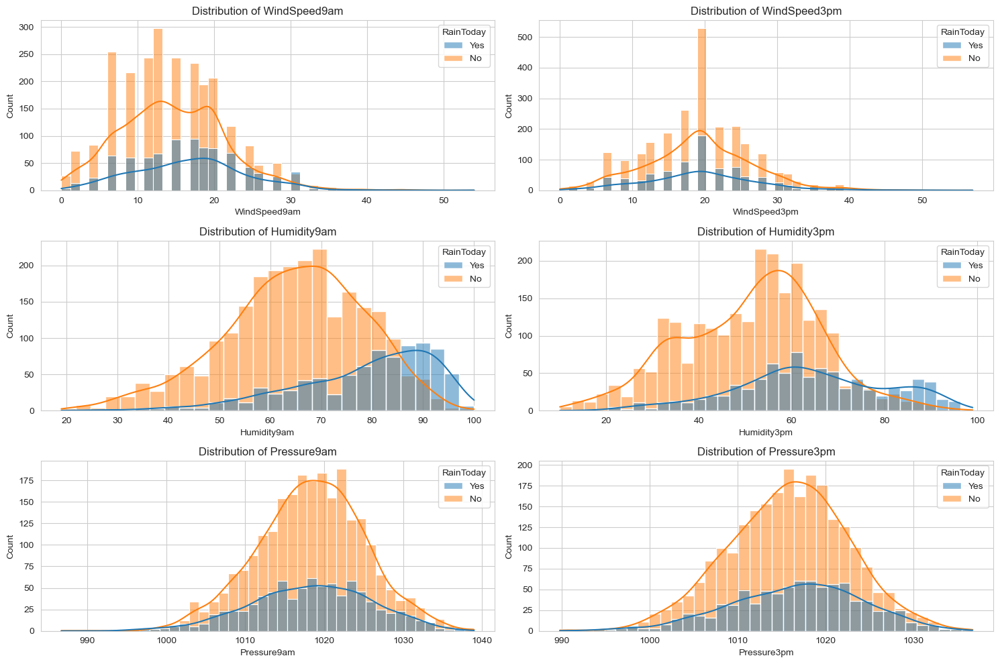

In [9]:
cols = ['WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm']
fig, axes = plt.subplots(3, 2, figsize=(15,10))
axes = axes.flatten()

for i, col in enumerate(cols):
    sns.histplot(x = df[col], ax = axes[i], hue = df["RainToday"], kde = True)
    axes[i].set_title(f"Distribution of {col}")
plt.tight_layout()

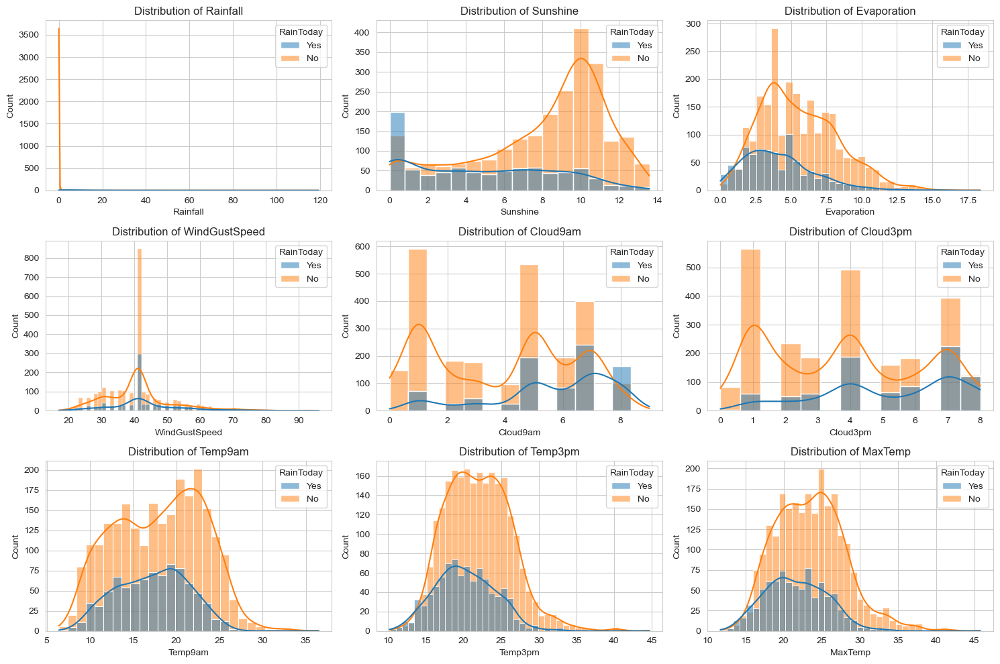

In [10]:
cols = ["Rainfall", "Sunshine", "Evaporation", "WindGustSpeed", "Cloud9am", "Cloud3pm", "Temp9am", "Temp3pm", "MaxTemp"]
fig, axes = plt.subplots(3, 3, figsize=(15,10))
axes = axes.flatten()

for i, col in enumerate(cols):
    sns.histplot(x = df[col], ax = axes[i], kde = True, hue = df["RainToday"])
    axes[i].set_title(f"Distribution of {col}")
plt.tight_layout()

<Axes: xlabel='MaxTemp', ylabel='Evaporation'>

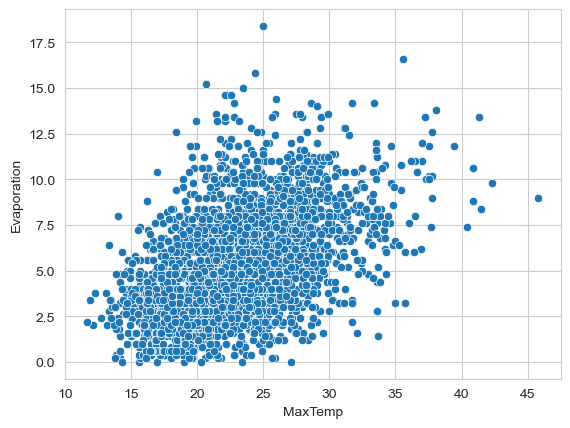

In [11]:
sns.scatterplot(x='MaxTemp', y='Evaporation', data=df)

In [12]:
con = df[['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
    'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 
    'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 
    'Cloud3pm', 'Temp9am', 'Temp3pm']].corr().round(3)
con

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
MinTemp,1.000,0.771,0.014,0.569,-0.063,0.128,-0.298,0.226,0.054,0.273,-0.392,-0.353,0.241,0.164,0.939,0.753
MaxTemp,0.771,1.000,-0.139,0.510,0.327,0.073,-0.349,0.156,-0.185,-0.151,-0.386,-0.420,-0.085,-0.099,0.859,0.961
Rainfall,0.014,-0.139,1.000,-0.110,-0.309,0.150,0.154,0.039,0.333,0.306,-0.038,0.002,0.245,0.201,-0.054,-0.143
Evaporation,0.569,0.510,-0.110,1.000,0.176,0.245,-0.078,0.292,-0.396,-0.102,-0.344,-0.298,-0.037,-0.038,0.606,0.475
Sunshine,-0.063,0.327,-0.309,0.176,1.000,-0.029,-0.058,0.178,-0.491,-0.586,-0.048,-0.095,-0.665,-0.678,0.114,0.346
WindGustSpeed,0.128,0.073,0.150,0.245,-0.029,1.000,0.256,0.510,-0.226,-0.095,-0.409,-0.352,0.024,0.044,0.160,0.036
WindSpeed9am,-0.298,-0.349,0.154,-0.078,-0.058,0.256,1.000,0.198,-0.190,-0.149,0.004,0.092,-0.062,-0.018,-0.334,-0.352
WindSpeed3pm,0.226,0.156,0.039,0.292,0.178,0.510,0.198,1.000,-0.289,-0.135,-0.334,-0.278,-0.051,-0.095,0.280,0.137
Humidity9am,0.054,-0.185,0.333,-0.396,-0.491,-0.226,-0.190,-0.289,1.000,0.658,0.262,0.249,0.432,0.331,-0.146,-0.155
Humidity3pm,0.273,-0.151,0.306,-0.102,-0.586,-0.095,-0.149,-0.135,0.658,1.000,0.152,0.180,0.464,0.472,0.132,-0.213


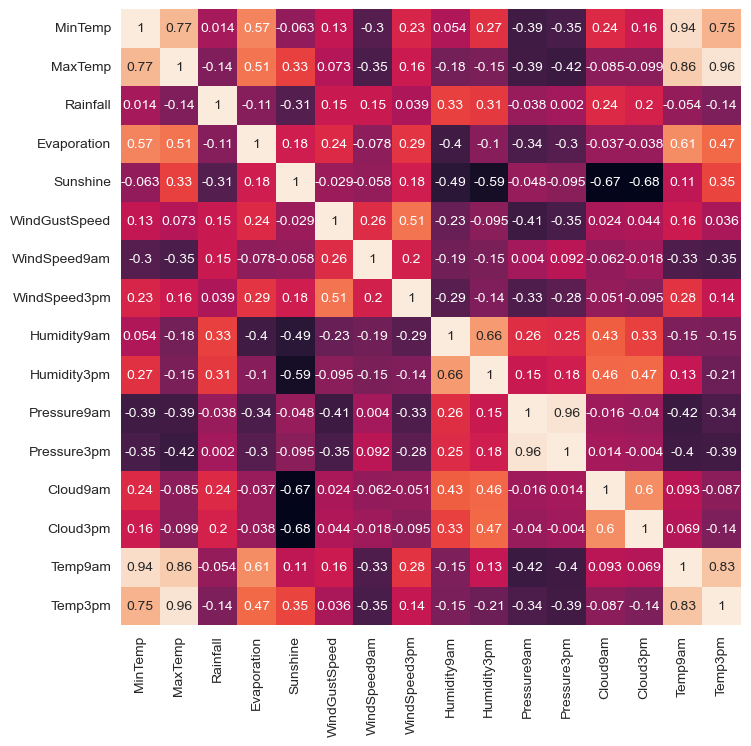

In [83]:
plt.figure(figsize=(8,8))
sns.heatmap(con, annot=True, cbar=False);

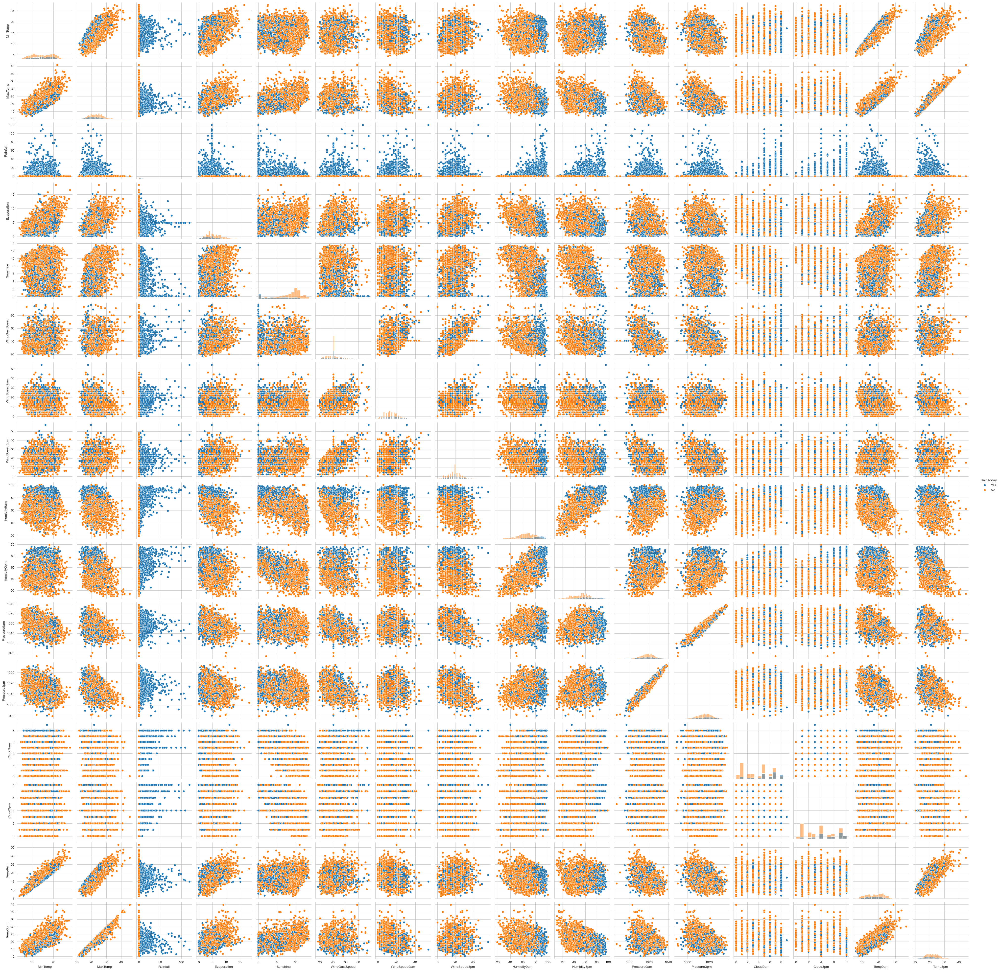

In [14]:
sns.pairplot(df, hue="RainToday", diag_kind = "hist");

### Data Pre-processing

In [16]:
df.head(10)

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2/1/2008,19.5,22.4,15.6,6.2,0.0,W,41,S,SSW,...,92,84,1017.6,1017.4,8,8,20.7,20.9,Yes,Yes
1,2/2/2008,19.5,25.6,6.0,3.4,2.7,W,41,W,E,...,83,73,1017.9,1016.4,7,7,22.4,24.8,Yes,Yes
2,2/3/2008,21.6,24.5,6.6,2.4,0.1,W,41,ESE,ESE,...,88,86,1016.7,1015.6,7,8,23.5,23.0,Yes,Yes
3,2/4/2008,20.2,22.8,18.8,2.2,0.0,W,41,NNE,E,...,83,90,1014.2,1011.8,8,8,21.4,20.9,Yes,Yes
4,2/5/2008,19.7,25.7,77.4,4.8,0.0,W,41,NNE,W,...,88,74,1008.3,1004.8,8,8,22.5,25.5,Yes,Yes
5,2/6/2008,20.2,27.2,1.6,2.6,8.6,W,41,W,ENE,...,69,62,1002.7,998.6,6,6,23.8,26.0,Yes,Yes
6,2/7/2008,18.6,26.3,6.2,5.2,5.2,W,41,W,S,...,75,80,999.0,1000.3,4,7,21.7,22.3,Yes,Yes
7,2/8/2008,17.2,22.3,27.6,5.8,2.1,W,41,S,SE,...,77,61,1008.3,1007.4,7,8,18.9,21.1,Yes,Yes
8,2/9/2008,16.4,20.8,12.6,4.8,3.0,W,41,SSW,W,...,92,91,1006.4,1007.6,7,7,17.1,16.5,Yes,Yes
9,2/10/2008,14.6,24.2,8.8,4.4,10.1,W,41,W,SSE,...,80,53,1014.0,1013.4,4,2,17.2,23.3,Yes,No


In [17]:
df.drop(columns=["Date"], inplace=True)

In [18]:
df_dummy = pd.get_dummies(data=df, columns=["WindDir9am","WindDir3pm","WindGustDir","RainToday"])
df_dummy.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,RainToday_No,RainToday_Yes
0,19.5,22.4,15.6,6.2,0.0,41,17,20,92,84,...,False,False,False,False,False,True,False,False,False,True
1,19.5,25.6,6.0,3.4,2.7,41,9,13,83,73,...,False,False,False,False,False,True,False,False,False,True
2,21.6,24.5,6.6,2.4,0.1,41,17,2,88,86,...,False,False,False,False,False,True,False,False,False,True
3,20.2,22.8,18.8,2.2,0.0,41,22,20,83,90,...,False,False,False,False,False,True,False,False,False,True
4,19.7,25.7,77.4,4.8,0.0,41,11,6,88,74,...,False,False,False,False,False,True,False,False,False,True


In [19]:
df_dummy.replace(["Yes", "No"], [1, 0], inplace=True)

In [20]:
df_dummy = df_dummy.astype('float')

In [21]:
X = df_dummy.drop(columns=["RainTomorrow"])
Y = df_dummy["RainTomorrow"]

In [23]:
train_x, test_x, train_y, test_y = train_test_split(X, Y, test_size = 0.25, random_state = 763)

In [24]:
print("Training Set: ", train_x.shape)
print("Testing Set: ", test_x.shape)

Training Set:  (2453, 66)
Testing Set:  (818, 66)


In [25]:
regr = LogisticRegression(solver='liblinear')
regr.fit(train_x, train_y)

LogisticRegression(solver='liblinear')

In [26]:
y_hat = regr.predict(test_x)
y_hat[:5]

array([1., 0., 0., 0., 0.])

In [27]:
accuracy_score(test_y, y_hat)

0.8325183374083129

In [28]:
jaccard_score(test_y, y_hat)

0.4689922480620155

In [29]:
f1_score(test_y, y_hat)

0.6385224274406333

In [30]:
score_df = pd.DataFrame([accuracy_score(test_y, y_hat), jaccard_score(test_y, y_hat), f1_score(test_y, y_hat)], index = ["accuracy_score", "jaccard_score", "f1_score"], columns=["Logistic Regression"])
score_df

,Logistic Regression
accuracy_score,0.832518
jaccard_score,0.468992
f1_score,0.638522


In [31]:
knn = KNeighborsClassifier(n_neighbors = 4, n_jobs = -1)
knn.fit(train_x, train_y)

KNeighborsClassifier(n_jobs=-1, n_neighbors=4)

In [32]:
y_hat = knn.predict(test_x)
y_hat[:5]

array([1., 0., 0., 0., 0.])

In [33]:
accuracy_score(test_y, y_hat)

0.815403422982885

In [34]:
jaccard_score(test_y, y_hat)

0.3574468085106383

In [35]:
f1_score(test_y, y_hat)

0.5266457680250783

In [36]:
score_df["K Neigbor"] = [accuracy_score(test_y, y_hat), jaccard_score(test_y, y_hat), f1_score(test_y, y_hat)]

In [37]:
mtree = DecisionTreeClassifier(max_depth = 4)
mtree.fit(train_x, train_y)

DecisionTreeClassifier(max_depth=4)

In [38]:
y_hat = mtree.predict(test_x)
y_hat[:5]

array([1., 0., 0., 0., 0.])

In [39]:
accuracy_score(test_y, y_hat)

0.8227383863080685

In [40]:
jaccard_score(test_y, y_hat)

0.36403508771929827

In [41]:
f1_score(test_y, y_hat)

0.5337620578778135

In [42]:
score_df["Decision Tree"] = [accuracy_score(test_y, y_hat), jaccard_score(test_y, y_hat), f1_score(test_y, y_hat)]

In [43]:
svm = SVC(C=2, kernel="sigmoid", gamma="auto")
svm.fit(train_x, train_y)

SVC(C=2, gamma='auto', kernel='sigmoid')

In [44]:
y_hat = svm.predict(test_x)
y_hat[:5]

array([0., 0., 0., 0., 0.])

In [45]:
accuracy_score(test_y, y_hat)

0.7420537897310513

In [46]:
jaccard_score(test_y, y_hat)

0.0

In [47]:
f1_score(test_y, y_hat)

0.0

In [48]:
score_df["SVM"] = [accuracy_score(test_y, y_hat), jaccard_score(test_y, y_hat), f1_score(test_y, y_hat)]

In [49]:
score_df = score_df.T
score_df

,accuracy_score,jaccard_score,f1_score
Logistic Regression,0.832518,0.468992,0.638522
K Neigbor,0.815403,0.357447,0.526646
Decision Tree,0.822738,0.364035,0.533762
SVM,0.742054,0.000000,0.000000


In [50]:
score_df = score_df.reset_index().rename({"index": "Model"}, axis=1)
score_df

,Model,accuracy_score,jaccard_score,f1_score
0,Logistic Regression,0.832518,0.468992,0.638522
1,K Neigbor,0.815403,0.357447,0.526646
2,Decision Tree,0.822738,0.364035,0.533762
3,SVM,0.742054,0.000000,0.000000


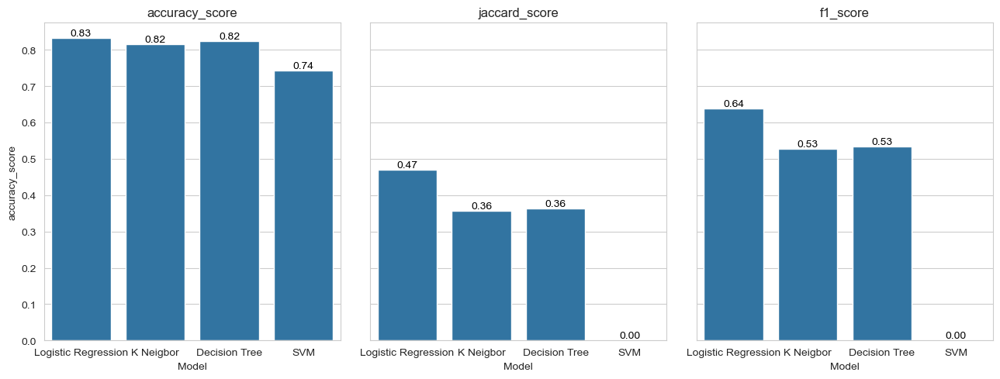

In [51]:
cols = ["accuracy_score", "jaccard_score", "f1_score"]
fig, axes = plt.subplots(1, 3, figsize=(13,5), sharey=True)
axes = axes.flatten()

for i, col in enumerate(cols):
    sns.barplot(data = score_df, x = "Model", y = col, ax = axes[i])
    axes[i].set_title(f"{col}")

    for p in axes[i].patches:
        height = p.get_height()
        axes[i].text(p.get_x() + p.get_width() / 2., height, f'{height:.2f}', 
                     ha='center', va='bottom', fontsize=10, color='black')
plt.tight_layout()

### Henceforth, we have made 4 models and evaluated the accuracy score and f1 score of each :)